# Code 4: Extending Linear Models

```{admonition} This is a reference notebook for the book Bayesian Modeling and Computation in Python
:class: tip, dropdown
The textbook is not needed to use or run this code, though the context and explanation is missing from this notebook.

If you'd like a copy it's available
[from the CRC Press](https://www.routledge.com/Bayesian-Modeling-and-Computation-in-Python/Martin-Kumar-Lao/p/book/9780367894368)
or from [Amazon](https://www.routledge.com/Bayesian-Modeling-and-Computation-in-Python/Martin-Kumar-Lao/p/book/9780367894368).
``

In [1]:
import pymc as pm
import matplotlib.pyplot as plt
import arviz as az
import xarray as xr
import pandas as pd
import numpy as np
from scipy import stats

In [2]:
az.style.use("arviz-grayscale")
plt.rcParams['figure.dpi'] = 300 

## Transforming Covariates

### Code 4.1

In [3]:
babies = pd.read_csv('../data/babies.csv')

# Add a constant term so we can use a the dot product approach
babies["Intercept"] = 1

babies.head()

,Month,Length,Intercept
0,0,48.5,1
1,0,50.5,1
2,0,50.5,1
3,0,52.0,1
4,0,47.5,1


### Figure 4.1

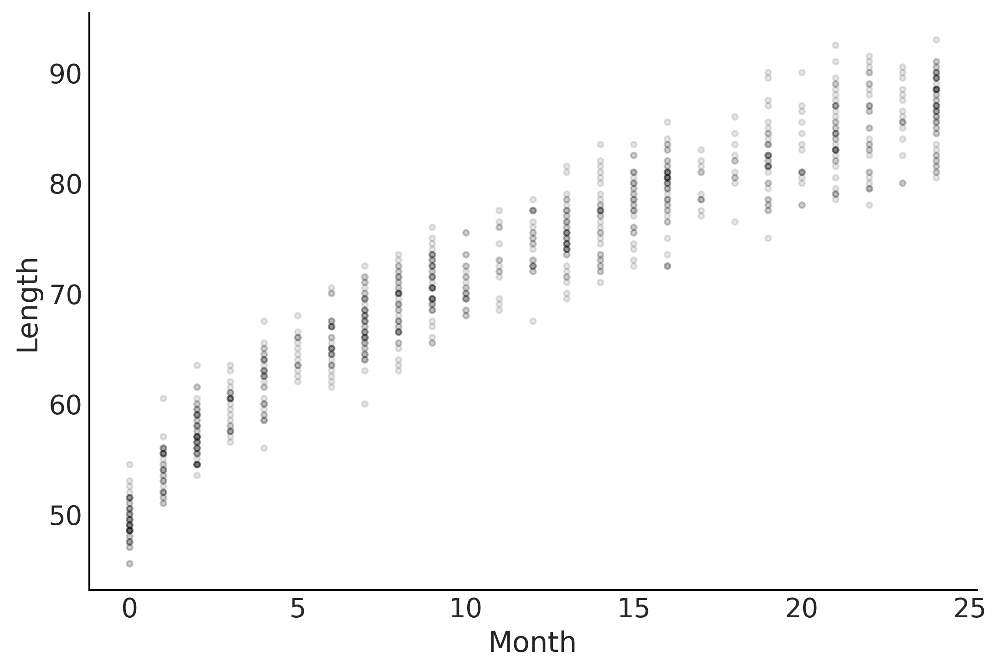

In [4]:
fig, ax = plt.subplots()

ax.plot(babies["Month"], babies["Length"], 'C0.', alpha=0.1)
ax.set_ylabel("Length")
ax.set_xlabel("Month");
plt.savefig('img/chp04/baby_length_scatter.png', dpi=300)

### Code 4.2

In [5]:
with pm.Model() as model_baby_linear:
    β = pm.Normal('β', sigma=10, shape=2)
    
    # Use dot product instead of expanded multiplication
    μ = pm.Deterministic("μ", pm.math.dot(babies[["Intercept", "Month"]], β))
    ϵ = pm.HalfNormal("ϵ", sigma=10)

    length = pm.Normal("length", mu=μ, sigma=ϵ, observed=babies["Length"])

    idata_linear = pm.sample(draws=2000, tune=4000, idata_kwargs={"log_likelihood": True})
    idata_linear.extend(pm.sample_posterior_predictive(idata_linear))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [β, ϵ]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 5 seconds.
/home/osvaldo/anaconda3/envs/bmcpu/lib/python3.11/site-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)
Sampling: [length]


### Figure 4.2

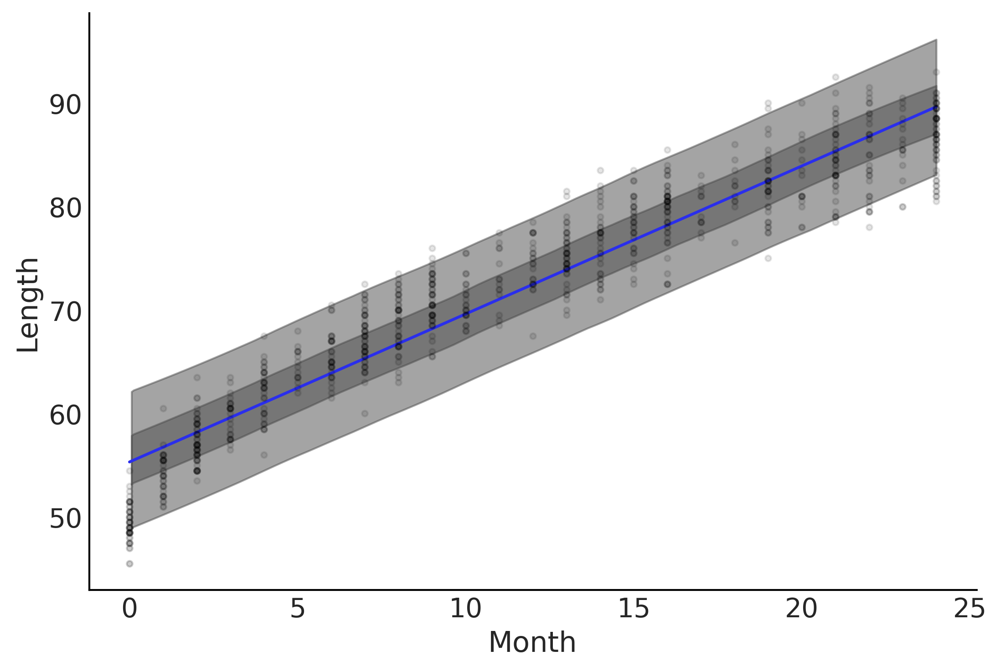

In [6]:
fig, ax = plt.subplots()

ax.set_ylabel("Length")
ax.set_xlabel("Month");

μ_m = idata_linear.posterior["μ"].mean(("chain", "draw"))

ax.plot(babies["Month"], μ_m, c='C4')
az.plot_hdi(babies["Month"], idata_linear.posterior_predictive["length"], hdi_prob=.50, ax=ax)
az.plot_hdi(babies["Month"], idata_linear.posterior_predictive["length"], hdi_prob=.94, ax=ax)

ax.plot(babies["Month"], babies["Length"], 'C0.', alpha=0.1)

plt.savefig('img/chp04/baby_length_linear_fit.png', dpi=300)

In [7]:
az.loo(idata_linear)

/home/osvaldo/anaconda3/envs/bmcpu/lib/python3.11/site-packages/arviz/utils.py:184: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)


Computed from 8000 posterior samples and 800 observations log-likelihood matrix.

         Estimate       SE
elpd_loo -2133.24    18.60
p_loo        3.14        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)      800  100.0%
 (0.5, 0.7]   (ok)          0    0.0%
   (0.7, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%

### Code 4.3

In [8]:
with pm.Model() as model_baby_sqrt:
    β = pm.Normal("β", sigma=10, shape=2)

    μ = pm.Deterministic("μ", β[0] + β[1] * np.sqrt(babies["Month"]))
    σ = pm.HalfNormal("σ", sigma=10)

    length = pm.Normal("length", mu=μ, sigma=σ, observed=babies["Length"])
    idata_sqrt = pm.sample(draws=2000, tune=4000, idata_kwargs={"log_likelihood": True})
    idata_sqrt.extend(pm.sample_posterior_predictive(idata_sqrt))


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [β, σ]


Sampling 4 chains for 4_000 tune and 2_000 draw iterations (16_000 + 8_000 draws total) took 7 seconds.
Sampling: [length]


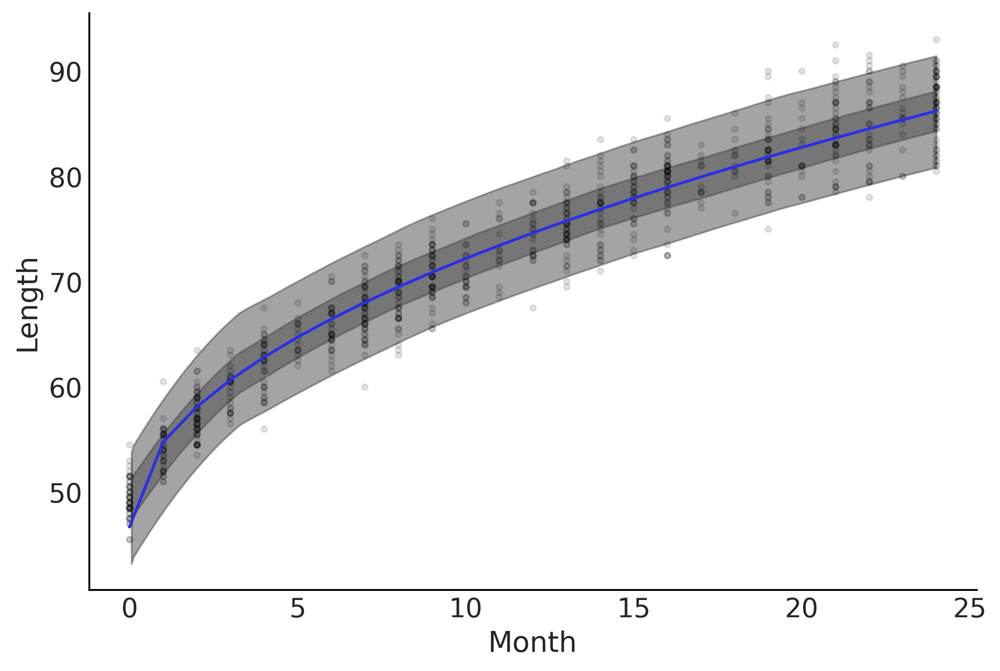

In [9]:
fig, ax = plt.subplots()

ax.plot(babies["Month"], babies["Length"], 'C0.', alpha=0.1)

ax.set_ylabel("Length")
ax.set_xlabel("Month");

μ_m = idata_sqrt.posterior["μ"].mean(("chain", "draw"))

az.plot_hdi(babies["Month"], idata_sqrt.posterior_predictive["length"], hdi_prob=.50, ax=ax)
az.plot_hdi(babies["Month"], idata_sqrt.posterior_predictive["length"], hdi_prob=.94, ax=ax)

ax.plot(babies["Month"], μ_m, c='C4')

plt.savefig('img/chp04/baby_length_sqrt_fit.png', dpi=300)

### Figure 4.3

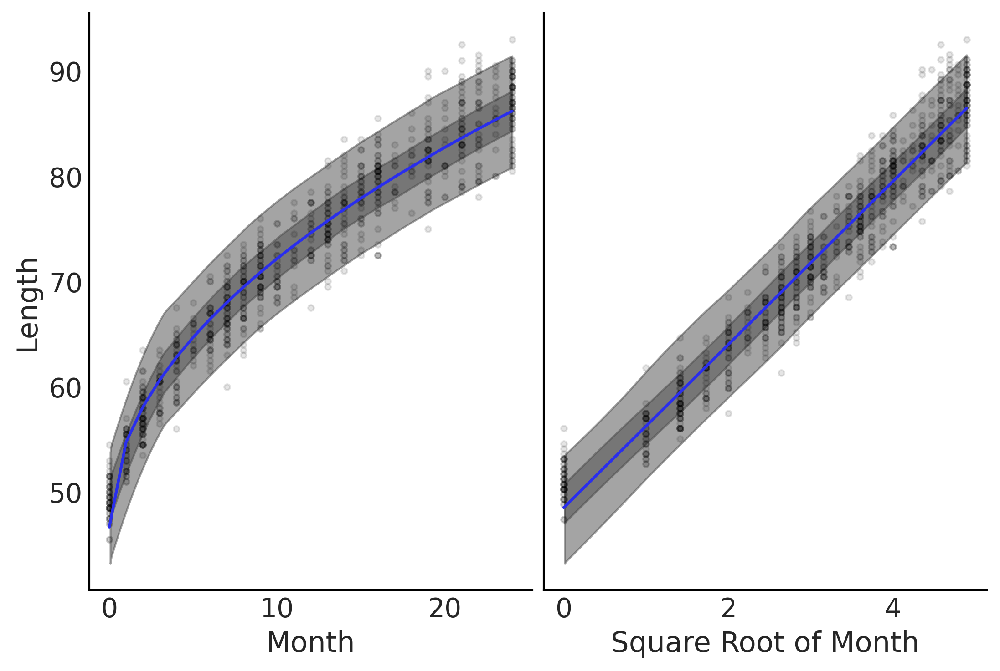

In [10]:
fig, axes = plt.subplots(1,2)
axes[0].plot(babies["Month"], babies["Length"], 'C0.', alpha=0.1)

μ_m = idata_sqrt.posterior["μ"].mean(("chain", "draw"))

axes[0].plot(babies["Month"], μ_m, c='C4')
az.plot_hdi(babies["Month"], idata_sqrt.posterior_predictive["length"], hdi_prob=.50, ax=axes[0])
az.plot_hdi(babies["Month"], idata_sqrt.posterior_predictive["length"], hdi_prob=.94, ax=axes[0])

axes[0].set_ylabel("Length")
axes[0].set_xlabel("Month");

axes[1].plot(np.sqrt(babies["Month"]), babies["Length"], 'C0.', alpha=0.1)
axes[1].set_xlabel("Square Root of Month");

az.plot_hdi(np.sqrt(babies["Month"]), idata_sqrt.posterior_predictive["length"], hdi_prob=.50, ax=axes[1])
az.plot_hdi(np.sqrt(babies["Month"]), idata_sqrt.posterior_predictive["length"], hdi_prob=.94, ax=axes[1])
axes[1].plot(np.sqrt(babies["Month"]), μ_m, c='C4')

axes[1].set_yticks([])
axes[1]

plt.savefig('img/chp04/baby_length_sqrt_fit.png', dpi=300)

In [11]:
az.compare({"Linear Model":idata_linear,
            "Non Linear Model":idata_sqrt})

/home/osvaldo/anaconda3/envs/bmcpu/lib/python3.11/site-packages/arviz/stats/stats.py:307: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_comp.loc[val] = (
/home/osvaldo/anaconda3/envs/bmcpu/lib/python3.11/site-packages/arviz/stats/stats.py:307: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'log' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_comp.loc[val] = (


,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
Non Linear Model,0,-1968.118254,2.983303,0.000000,0.929207,18.967138,0.000000,False,log
Linear Model,1,-2133.239028,3.136569,165.120774,0.070793,18.598216,20.071418,False,log


## Varying Uncertainty

### Code 4.4

In [12]:
with pm.Model() as model_baby_vv:
    β = pm.Normal("β", sigma=10, shape=2)

    # Additional variance terms
    δ = pm.HalfNormal("δ", sigma=10, shape=2)

    μ = pm.Deterministic("μ", β[0] + β[1] * np.sqrt(babies["Month"]))
    σ = pm.Deterministic("σ", δ[0] + δ[1] * babies["Month"])

    length = pm.Normal("length", mu=μ, sigma=σ, observed=babies["Length"])

    idata_baby_vv = pm.sample(2000, target_accept=.95)
    idata_baby_vv.extend(pm.sample_posterior_predictive(idata_baby_vv))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [β, δ]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 7 seconds.
Sampling: [length]


In [13]:
az.summary(idata_baby_vv, var_names=["δ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
δ[0],2.387,0.117,2.176,2.610,0.002,0.002,3032.0,3909.0,1.0
δ[1],0.038,0.009,0.019,0.055,0.000,0.000,2988.0,3421.0,1.0


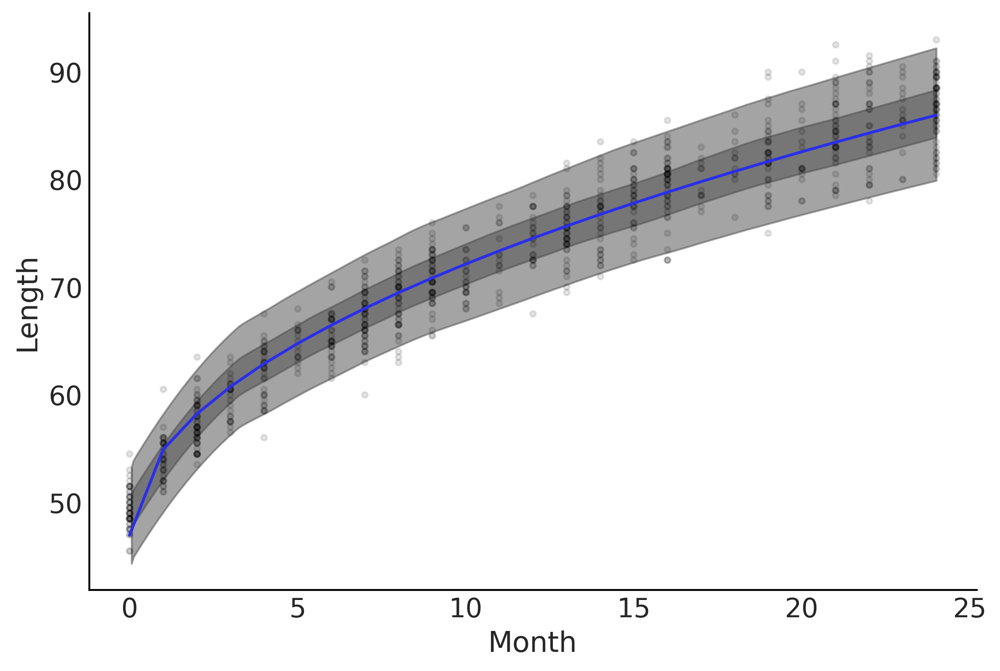

In [14]:
fig, ax = plt.subplots()

ax.set_ylabel("Length")
ax.set_xlabel("Month");

ax.plot(babies["Month"], babies["Length"], 'C0.', alpha=0.1)

μ_m = idata_baby_vv.posterior["μ"].mean(("chain", "draw"))

ax.plot(babies["Month"], μ_m, c='C4')

az.plot_hdi(babies["Month"], idata_baby_vv.posterior_predictive["length"], hdi_prob=.50, ax=ax)
az.plot_hdi(babies["Month"], idata_baby_vv.posterior_predictive["length"], hdi_prob=.94, ax=ax)

plt.savefig('img/chp04/baby_length_sqrt_vv_fit.png', dpi=300)

### Figure 4.4

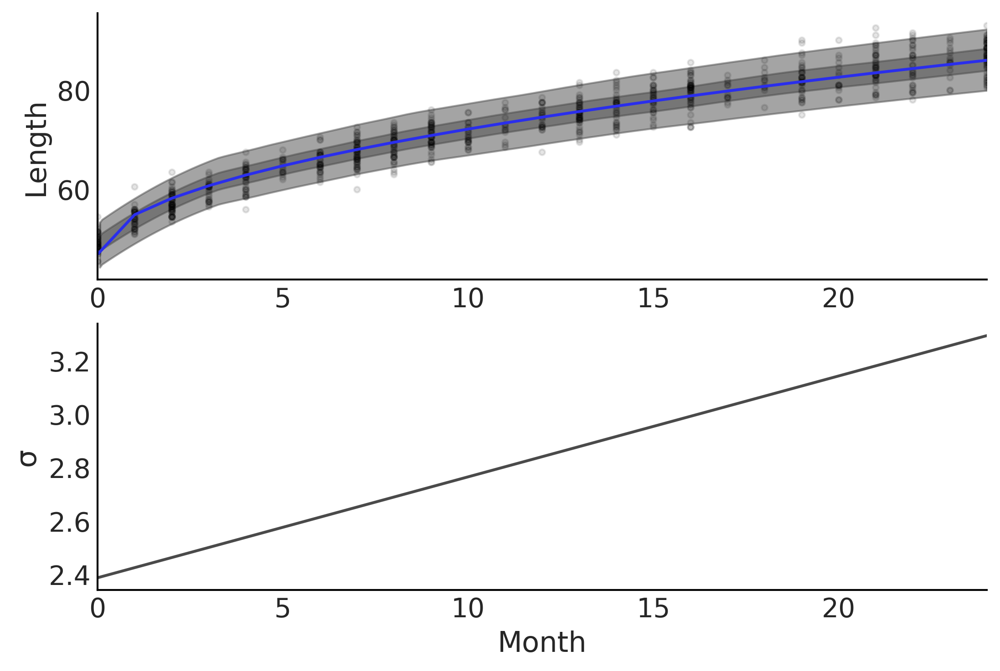

In [15]:
fig, axes = plt.subplots(2,1)

axes[0].plot(babies["Month"], babies["Length"], 'C0.', alpha=0.1)

μ_m = idata_baby_vv.posterior["μ"].mean(("chain", "draw"))

axes[0].plot(babies["Month"], μ_m, c='C4')

az.plot_hdi(babies["Month"], idata_baby_vv.posterior_predictive["length"], hdi_prob=.50, ax=axes[0])
az.plot_hdi(babies["Month"], idata_baby_vv.posterior_predictive["length"], hdi_prob=.94, ax=axes[0])
axes[0].set_ylabel("Length")

σ_m = idata_baby_vv.posterior["σ"].mean(("chain", "draw"))

axes[1].plot(babies["Month"], σ_m, c='C1')

axes[1].set_ylabel("σ")
axes[1].set_xlabel("Month")

axes[0].set_xlim(0,24)
axes[1].set_xlim(0,24)

plt.savefig('img/chp04/baby_length_sqrt_vv_fit_include_error.png', dpi=300)

## Interaction effects

### Code 4.5

In [16]:
tips_df = pd.read_csv('../data/tips.csv')
tips_df.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


In [17]:
tips = tips_df["tip"]
total_bill_c = (tips_df["total_bill"] - tips_df["total_bill"].mean())  
smoker = pd.Categorical(tips_df["smoker"]).codes

with pm.Model() as model_no_interaction:
    β = pm.Normal("β", mu=0, sigma=1, shape=3)
    σ = pm.HalfNormal("σ", 1)

    μ = (β[0] +
         β[1] * total_bill_c + 
         β[2] * smoker)

    obs = pm.Normal("obs", μ, σ, observed=tips)
    idata_no_interaction = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [β, σ]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


In [18]:
idata_no_interaction.posterior

<xarray.Dataset>
Dimensions:  (chain: 4, draw: 1000, β_dim_0: 3)
Coordinates:
  * chain    (chain) int64 0 1 2 3
  * draw     (draw) int64 0 1 2 3 4 5 6 7 8 ... 992 993 994 995 996 997 998 999
  * β_dim_0  (β_dim_0) int64 0 1 2
Data variables:
    β        (chain, draw, β_dim_0) float64 3.0 0.1145 ... 0.1029 -0.2213
    σ        (chain, draw) float64 0.9961 1.018 0.9904 ... 1.0 0.8929 1.113
Attributes:
    created_at:                 2023-12-21T15:50:46.399956
    arviz_version:              0.14.0
    inference_library:          pymc
    inference_library_version:  5.10.2
    sampling_time:              2.337444543838501
    tuning_steps:               1000

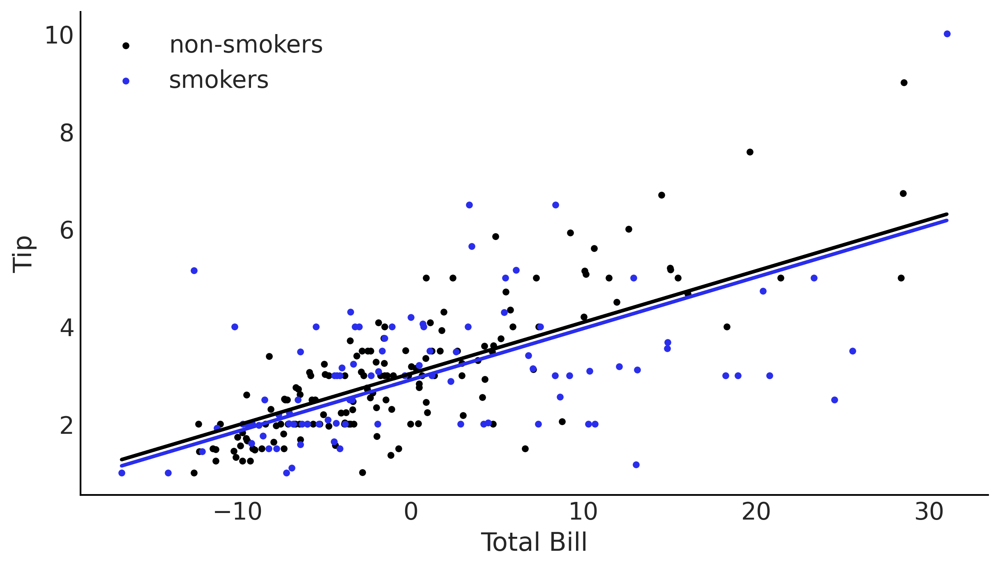

In [20]:
_, ax = plt.subplots(figsize=(8, 4.5))

total_bill_c_da = xr.DataArray(total_bill_c)

posterior_no_interaction = az.extract(idata_no_interaction, var_names=["β"])

β0_nonint = posterior_no_interaction.sel(β_dim_0=0)
β1_nonint = posterior_no_interaction.sel(β_dim_0=1)
β2_nonint = posterior_no_interaction.sel(β_dim_0=2)

pred_y_non_smokers = β0_nonint + β1_nonint * total_bill_c_da
pred_y_smokers = β0_nonint + β1_nonint * total_bill_c_da + β2_nonint

ax.scatter(total_bill_c[smoker==0], tips[smoker==0], label='non-smokers', marker='.')
ax.scatter(total_bill_c[smoker==1], tips[smoker==1], label='smokers', marker='.', c="C4")
ax.set_xlabel('Total Bill')
ax.set_ylabel('Tip')
ax.legend()

ax.plot(total_bill_c, pred_y_non_smokers.mean("sample"), lw=2)
ax.plot(total_bill_c, pred_y_smokers.mean("sample"), lw=2, c="C4");

### Code 4.6

In [21]:
with pm.Model() as model_interaction:
    β = pm.Normal('β', mu=0, sigma=1, shape=4)
    σ = pm.HalfNormal('σ', 1)

    μ = (β[0] +
         β[1] * total_bill_c + 
         β[2] * smoker +
         β[3] * smoker * total_bill_c
        )

    obs = pm.Normal('obs', μ, σ, observed=tips)
    idata_interaction = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [β, σ]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


### Figure 4.5

/home/osvaldo/anaconda3/envs/bmcpu/lib/python3.11/site-packages/arviz/plots/hdiplot.py:156: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)
/home/osvaldo/anaconda3/envs/bmcpu/lib/python3.11/site-packages/arviz/plots/hdiplot.py:156: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)
/home/osvaldo/anaconda3/envs/bmcpu/lib/python3.11/site-packages/arviz/plots/hdiplot.py:156: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=F

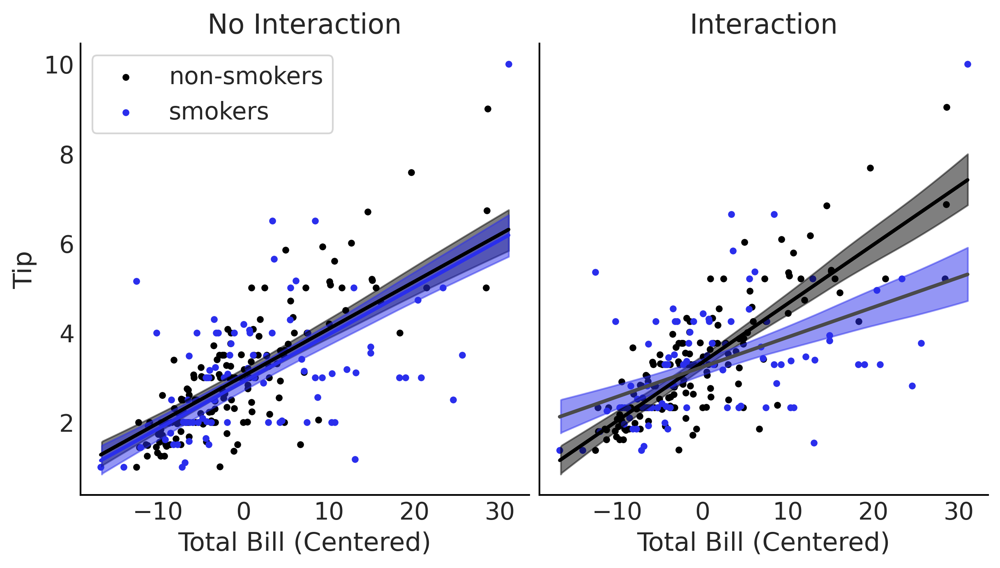

In [22]:
_, ax = plt.subplots(1, 2, figsize=(8, 4.5))

posterior_no_interaction = az.extract(idata_no_interaction, var_names=["β"])

β0_nonint = posterior_no_interaction.sel(β_dim_0=0)
β1_nonint = posterior_no_interaction.sel(β_dim_0=1)
β2_nonint = posterior_no_interaction.sel(β_dim_0=2)

pred_y_non_smokers = β0_nonint + β1_nonint * total_bill_c_da
pred_y_smokers = β0_nonint + β1_nonint * total_bill_c_da + β2_nonint

ax[0].scatter(total_bill_c[smoker==0], tips[smoker==0], label='non-smokers', marker='.')
ax[0].scatter(total_bill_c[smoker==1], tips[smoker==1], label='smokers', marker='.', c="C4")
ax[0].set_xlabel('Total Bill (Centered)')
ax[0].set_ylabel('Tip')
ax[0].legend(frameon=True)

ax[0].plot(total_bill_c, pred_y_non_smokers.mean("sample"), lw=2)
ax[0].plot(total_bill_c, pred_y_smokers.mean("sample"), lw=2, c="C4")
ax[0].set_title('No Interaction')


az.plot_hdi(total_bill_c, pred_y_non_smokers, color='C0', ax=ax[0])
az.plot_hdi(total_bill_c, pred_y_smokers, ax=ax[0], color="C4");


posterior_interaction = az.extract(idata_interaction, var_names=["β"])

β0_int = posterior_interaction.sel(β_dim_0=0)
β1_int = posterior_interaction.sel(β_dim_0=1)
β2_int = posterior_interaction.sel(β_dim_0=2)
β3_int = posterior_interaction.sel(β_dim_0=3)


# Because smoker=0 I am omitting the terms including the smoker covariate
pred_y_non_smokers = (β0_int +
                      β1_int * total_bill_c_da)

# Because x1=1 I am ommiting x1
pred_y_smokers = (β0_int +
                  β1_int * total_bill_c_da +
                  β2_int +
                  β3_int * total_bill_c_da)


ax[1].scatter(total_bill_c[smoker==0], tips[smoker==0], label='non-smokers', marker='.')
ax[1].scatter(total_bill_c[smoker==1], tips[smoker==1], label='smokers', marker='.', c="C4")
ax[1].set_xlabel('Total Bill (Centered)')
ax[1].set_yticks([])

ax[1].set_title('Interaction')

ax[1].plot(total_bill_c, pred_y_non_smokers.mean("sample"), lw=2)
ax[1].plot(total_bill_c, pred_y_smokers.mean("sample"), lw=2)
az.plot_hdi(total_bill_c, pred_y_non_smokers, color='C0', ax=ax[1])
az.plot_hdi(total_bill_c, pred_y_smokers, ax=ax[1], color="C4");

plt.savefig('img/chp04/smoker_tip_interaction.png', dpi=300)

## Robust Regression

### Figure 4.6

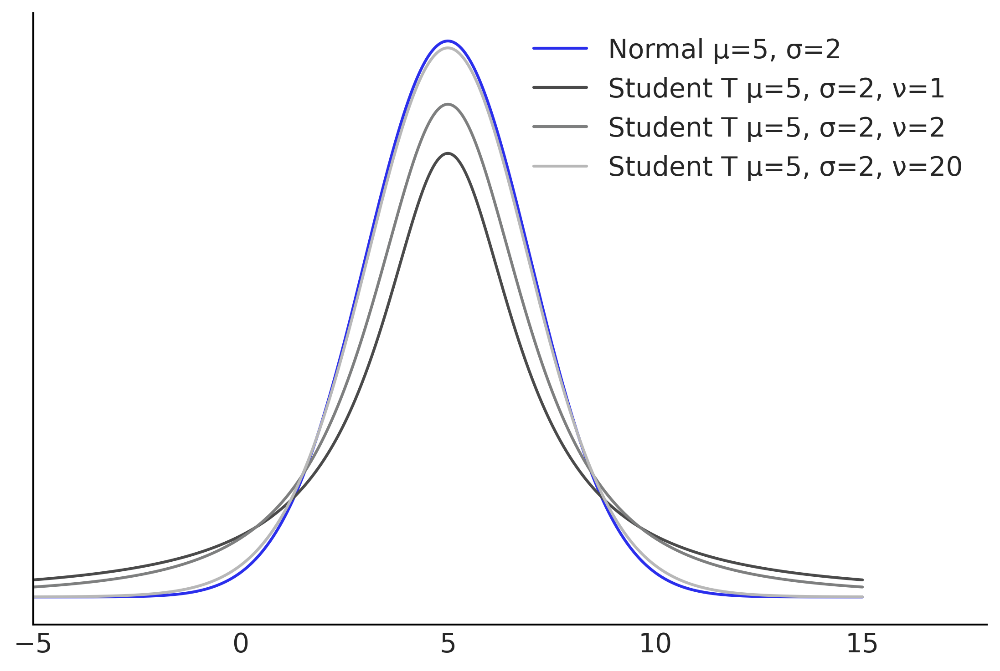

In [23]:
mean = 5
sigma = 2

x = np.linspace(-5, 15, 1000)
fig, ax = plt.subplots()

ax.plot(x, stats.norm(5,2).pdf(x), label=f"Normal μ={mean}, σ={sigma}", color="C4")

for i, nu in enumerate([1, 2, 20],1):
    ax.plot(x, stats.t(loc=5, scale=2, df=nu).pdf(x), label=f"Student T μ={mean}, σ={sigma}, ν={nu}", color=f"C{i}")

ax.set_xlim(-5, 18)
ax.legend(loc="upper right", frameon=False)
ax.set_yticks([])
plt.savefig('img/chp04/studentt_normal_comparison.png', dpi=300)

### Figure 4.7

In [24]:
def generate_sales(*, days, mean, std, label):
    np.random.seed(0)
    df = pd.DataFrame(index=range(1, days+1), columns=["customers", "sales"])
    for day in range(1, days+1):
        num_customers = stats.randint(30, 100).rvs()+1
        
        # This is correct as there is an independent draw for each customers orders
        dollar_sales = stats.norm(mean, std).rvs(num_customers).sum()
        
        df.loc[day, "customers"] = num_customers
        df.loc[day, "sales"] = dollar_sales
        
    # Fix the types as not to cause Theano errors
    df = df.astype({'customers': 'int32', 'sales': 'float32'})
    
    # Sorting will make plotting the posterior predictive easier later
    df["Food_Category"] = label
    df = df.sort_values("customers")
    return df


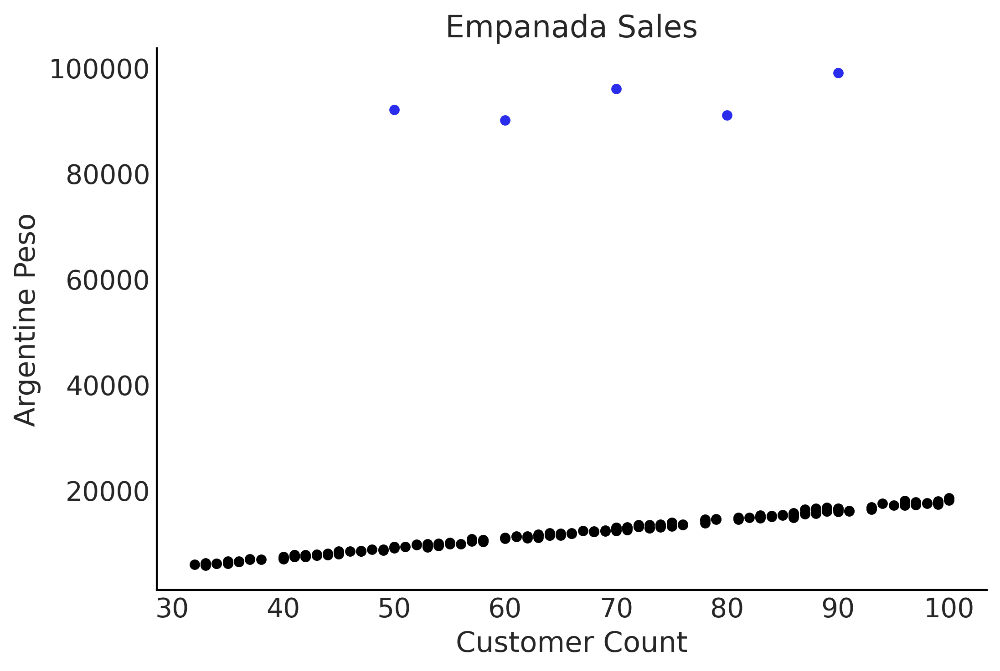

In [25]:
fig, ax = plt.subplots()

empanadas =  generate_sales(days=200, mean=180, std=30, label="Empanada")
empanadas.iloc[0] = [50, 92000, "Empanada"]
empanadas.iloc[1] = [60, 90000, "Empanada"]
empanadas.iloc[2] = [70, 96000, "Empanada"]
empanadas.iloc[3] = [80, 91000, "Empanada"]
empanadas.iloc[4] = [90, 99000, "Empanada"]

empanadas = empanadas.sort_values("customers")

empanadas.sort_values("sales")[:-5].plot(x="customers", y="sales", kind="scatter", ax=ax);
empanadas.sort_values("sales")[-5:].plot(x="customers", y="sales", kind="scatter", c="C4", ax=ax);

ax.set_ylabel("Argentine Peso")
ax.set_xlabel("Customer Count")
ax.set_title("Empanada Sales")
plt.savefig('img/chp04/empanada_scatter_plot.png', dpi=300)

### Code 4.7

In [26]:
with pm.Model() as model_non_robust:
    σ = pm.HalfNormal("σ", 50)
    β = pm.Normal('β', mu=150, sigma=20)

    μ = pm.Deterministic("μ", β * empanadas["customers"])
    
    sales = pm.Normal("sales", mu=μ, sigma=σ, observed=empanadas["sales"])
    
    idata_non_robust = pm.sample(random_seed=1, idata_kwargs={"log_likelihood": True})
    idata_non_robust.extend(pm.sample_posterior_predictive(idata_non_robust))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [σ, β]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.
Sampling: [sales]


### Figure 4.8

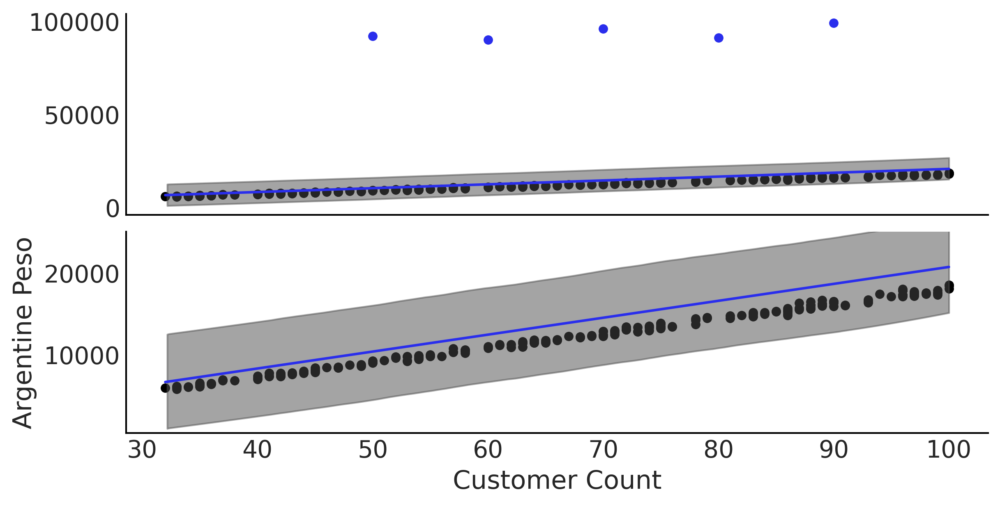

In [27]:
fig, axes = plt.subplots(2, 1, figsize=(8, 4), sharex=True)
μ_m = idata_non_robust.posterior["μ"].mean(("chain", "draw"))

for i in range(2):
    empanadas.sort_values("sales")[:-5].plot(x="customers", y="sales", kind="scatter", ax=axes[i]);
    empanadas.sort_values("sales")[-5:].plot(x="customers", y="sales", kind="scatter", c="C4", ax=axes[i]);
    axes[i].plot(empanadas.customers, μ_m, c='C4')
    az.plot_hdi(empanadas.customers, idata_non_robust.posterior_predictive["sales"], hdi_prob=.95, ax=axes[i])

    axes[1].set_ylabel("Argentine Peso")

axes[0].set_ylabel("")
axes[1].set_xlabel("Customer Count")
axes[1].set_ylim(400, 25000);
plt.savefig('img/chp04/empanada_scatter_non_robust.png', dpi=300)

### Table 4.1

In [28]:
az.summary(idata_non_robust, kind="stats", var_names=["β", "σ"]).round(1)

,mean,sd,hdi_3%,hdi_97%
β,207.1,2.9,201.8,212.7
σ,2951.6,25.9,2898.4,2996.6


In [29]:
with pm.Model() as model_robust:
    σ = pm.HalfNormal("σ", 50)
    β = pm.Normal("β", mu=150, sigma=20)
    ν = pm.HalfNormal("ν", 20)

    μ = pm.Deterministic("μ", β * empanadas["customers"])
    
    sales = pm.StudentT("sales", mu=μ, sigma=σ, nu=ν,
                        observed=empanadas["sales"])
        
    idata_robust  = pm.sample(random_seed=0, idata_kwargs={"log_likelihood": True})
    idata_robust.extend(pm.sample_posterior_predictive(idata_robust))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [σ, β, ν]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.
Sampling: [sales]


### Table 4.2

In [30]:
az.summary(idata_robust, var_names=["β", "σ", "ν"], kind="stats").round(1)

,mean,sd,hdi_3%,hdi_97%
β,179.6,0.2,179.1,180.1
σ,152.5,13.6,127.2,177.6
ν,1.3,0.2,1.0,1.6


### Figure 4.9

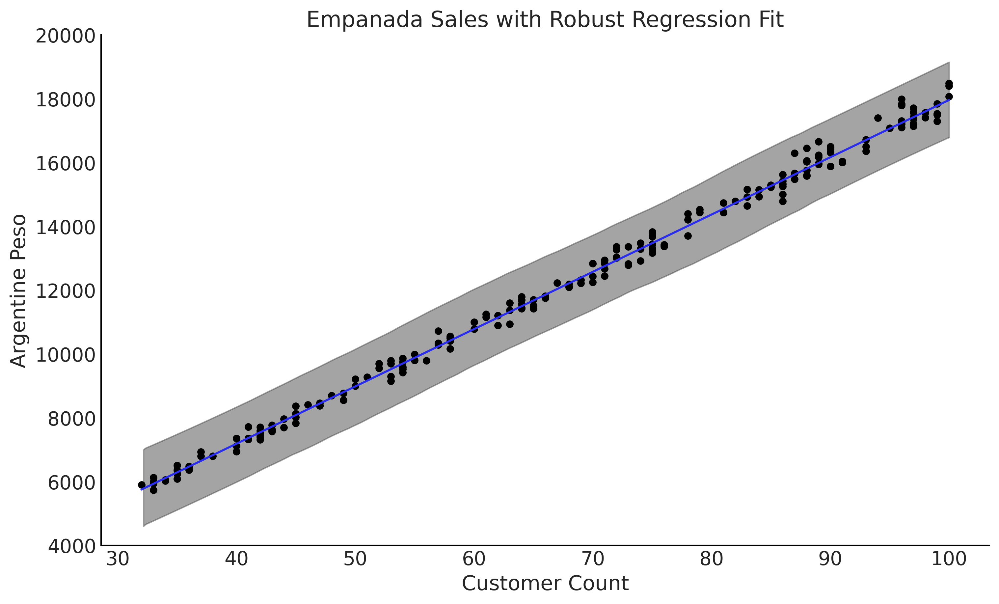

In [31]:
fig, ax = plt.subplots(figsize=(10, 6))
μ_m = idata_robust.posterior["μ"].mean(("chain", "draw"))
    
ax.plot(empanadas.customers, μ_m, c='C4')
az.plot_hdi(empanadas.customers, idata_robust.posterior_predictive["sales"], hdi_prob=.95, ax=ax)

empanadas.plot(x="customers", y="sales", kind="scatter", ax=ax)
ax.set_ylim(4000, 20000);
ax.set_ylabel("Argentine Peso")
ax.set_xlabel("Customer Count")
ax.set_title("Empanada Sales with Robust Regression Fit")
plt.savefig('img/chp04/empanada_scatter_robust.png', dpi=300)

In [32]:
az.compare({"Non robust": idata_non_robust,
            "Robust":idata_robust})

/home/osvaldo/anaconda3/envs/bmcpu/lib/python3.11/site-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(
/home/osvaldo/anaconda3/envs/bmcpu/lib/python3.11/site-packages/arviz/stats/stats.py:307: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'False' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  df_comp.loc[val] = (
/home/osvaldo/anaconda3/envs/bmcpu/lib/python3.11/site-packages/arviz/stats/stats.py:307: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of 

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
Robust,0,-1473.561536,5.478479,0.000000,1.000000e+00,31.799319,0.000000,False,log
Non robust,1,-3708.130924,160.417760,2234.569388,1.210143e-14,833.467544,803.820969,True,log


## Pooling, Multilevel Models, and Mixed Effects

In [33]:
def generate_sales(*, days, mean, std, label):
    np.random.seed(0)
    df = pd.DataFrame(index=range(1, days+1), columns=["customers", "sales"])
    for day in range(1, days+1):
        num_customers = stats.randint(30, 100).rvs()+1
        
        # This is correct as there is an independent draw for each customers orders
        dollar_sales = stats.norm(mean, std).rvs(num_customers).sum()
        
        df.loc[day, "customers"] = num_customers
        df.loc[day, "sales"] = dollar_sales
        
    # Fix the types as not to cause Theano errors
    df = df.astype({'customers': 'int32', 'sales': 'float32'})
    
    # Sorting will make plotting the posterior predictive easier later
    df["Food_Category"] = label
    df = df.sort_values("customers")
    return df


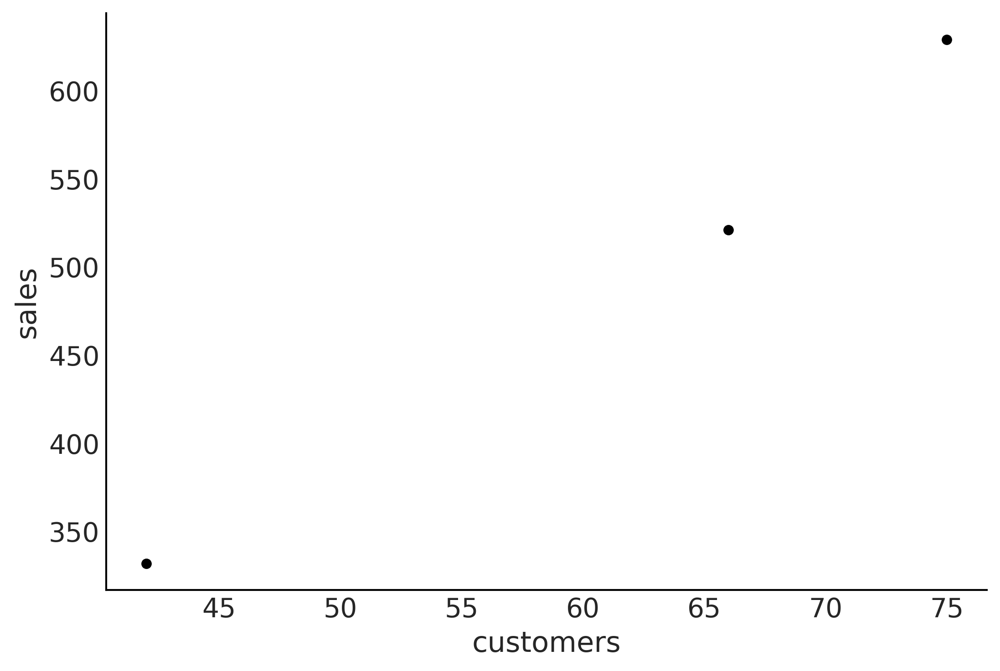

In [34]:
pizza_df = generate_sales(days=365, mean=13, std=5, label="Pizza")
sandwich_df = generate_sales(days=100, mean=6, std=5, label="Sandwich")

salad_days = 3
salad_df = generate_sales(days=salad_days, mean=8 ,std=3, label="Salad")

salad_df.plot(x="customers", y="sales", kind="scatter");

In [35]:
sales_df = pd.concat([pizza_df, sandwich_df, salad_df]).reset_index(drop=True)
sales_df["Food_Category"] = pd.Categorical(sales_df["Food_Category"])
sales_df

,customers,sales,Food_Category
0,31,459.895203,Pizza
1,31,401.147736,Pizza
2,31,413.345245,Pizza
3,31,371.909241,Pizza
4,32,433.797089,Pizza
...,...,...,...
463,100,611.736816,Sandwich
464,100,667.152954,Sandwich
465,42,331.625702,Salad
466,66,520.900940,Salad


### Figure 4.10

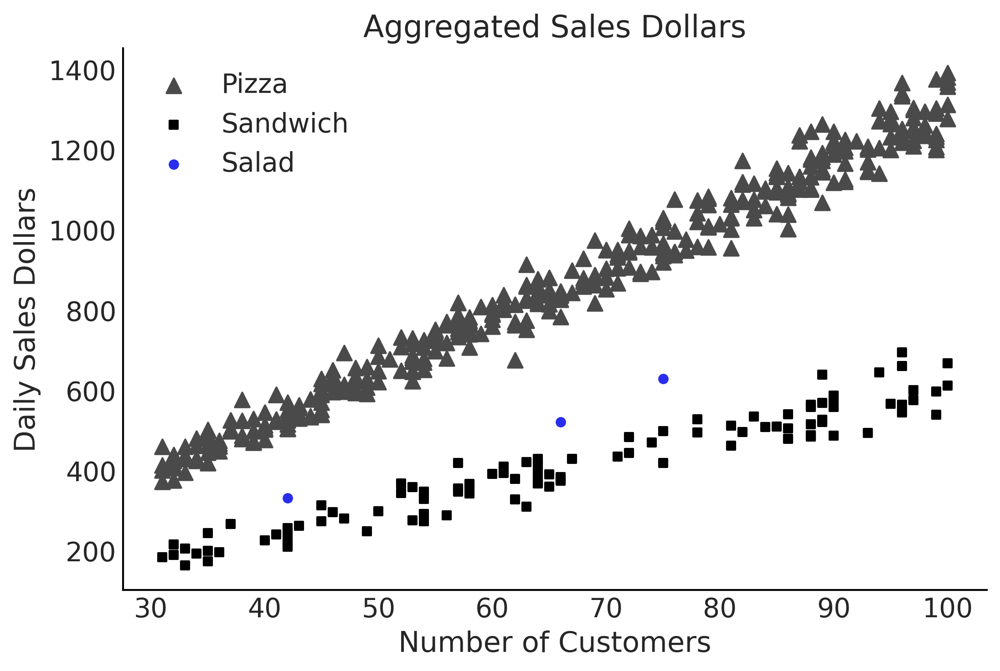

In [36]:
fig, ax = plt.subplots()
pizza_df.plot(x="customers", y="sales", kind="scatter", ax=ax, c="C1", label="Pizza", marker="^", s=60);
sandwich_df.plot(x="customers", y="sales", kind="scatter", ax=ax,  label="Sandwich", marker="s");
salad_df.plot(x="customers", y="sales", kind="scatter", ax=ax, label="Salad", c="C4");

ax.set_xlabel("Number of Customers")
ax.set_ylabel("Daily Sales Dollars")
ax.set_title("Aggregated Sales Dollars")
ax.legend()

plt.savefig('img/chp04/restaurant_order_scatter.png', dpi=300)

### Unpooled Model

### Code 4.9

In [37]:
customers = sales_df.loc[:, "customers"].values
sales_observed = sales_df.loc[:, "sales"].values
food_category = pd.Categorical(sales_df["Food_Category"])

coords = {"meals":food_category.categories}

with pm.Model(coords=coords) as model_sales_unpooled:
    σ = pm.HalfNormal("σ", 20, dims="meals")
    β = pm.Normal("β", mu=10, sigma=10, dims="meals")
    
    μ = pm.Deterministic("μ", β[food_category.codes] *customers)
    
    sales = pm.Normal("sales", mu=μ, sigma=σ[food_category.codes],
                      observed=sales_observed)
    
    idata_sales_unpooled = pm.sample(target_accept=.9)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [σ, β]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


### Figure 4.12

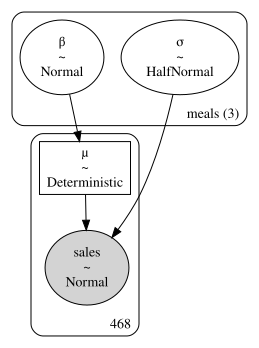

In [38]:
sales_unpooled_diagram = pm.model_to_graphviz(model_sales_unpooled)
sales_unpooled_diagram.render("img/chp04/salad_sales_basic_regression_model_unpooled", format="png", cleanup=True)
sales_unpooled_diagram

In [39]:
idata_salads_sales_unpooled = idata_sales_unpooled.posterior.sel(meals="Salad", μ_dim_0=slice(465, 467))

In [40]:
az.summary(idata_sales_unpooled, var_names=["β", "σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β[Pizza],13.025,0.030,12.968,13.082,0.000,0.000,6699.0,2873.0,1.01
β[Salad],8.128,0.214,7.682,8.511,0.004,0.003,3084.0,2389.0,1.00
β[Sandwich],6.113,0.051,6.016,6.207,0.001,0.000,5272.0,2526.0,1.00
σ[Pizza],40.123,1.473,37.504,43.107,0.018,0.013,6928.0,2597.0,1.00
σ[Salad],21.490,8.481,9.035,37.845,0.139,0.104,4191.0,3081.0,1.00
σ[Sandwich],35.953,2.464,31.580,40.566,0.031,0.022,6273.0,2666.0,1.00


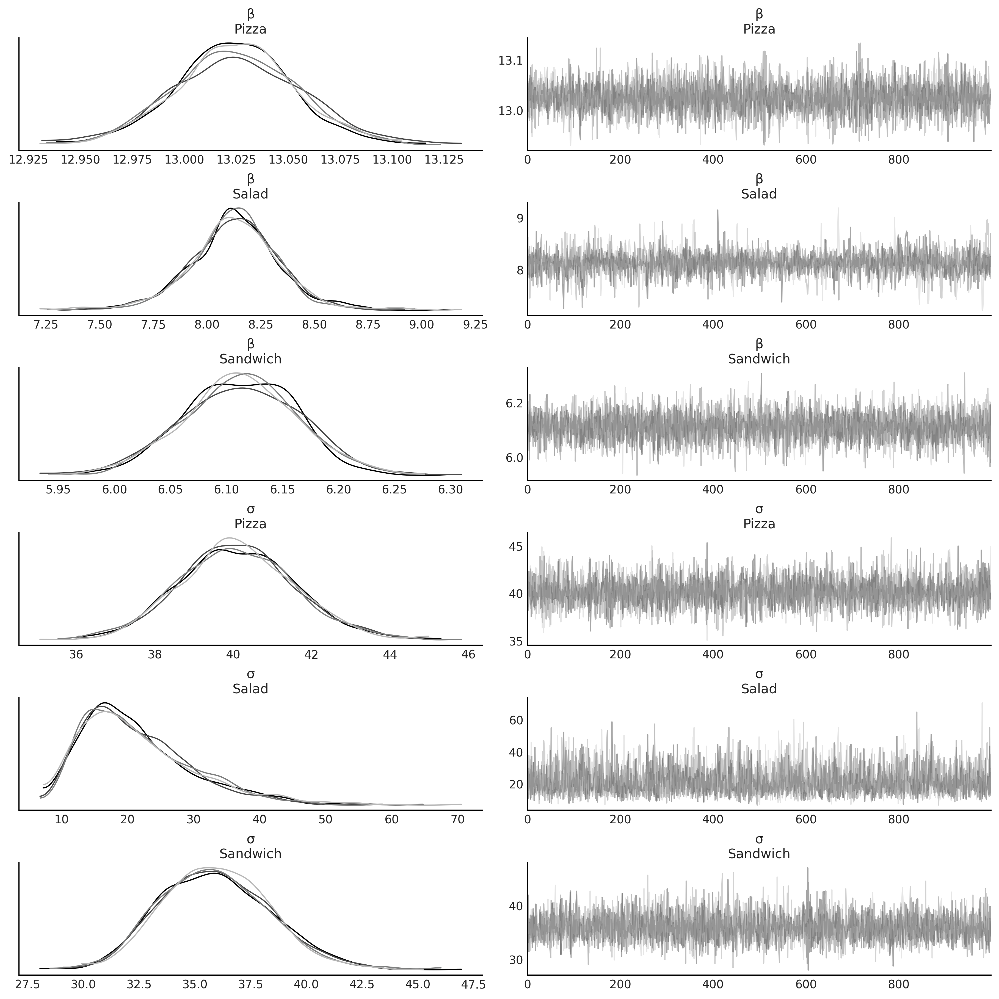

In [41]:
az.plot_trace(idata_sales_unpooled, var_names=["β", "σ"], compact=False);

### Figure 4.13

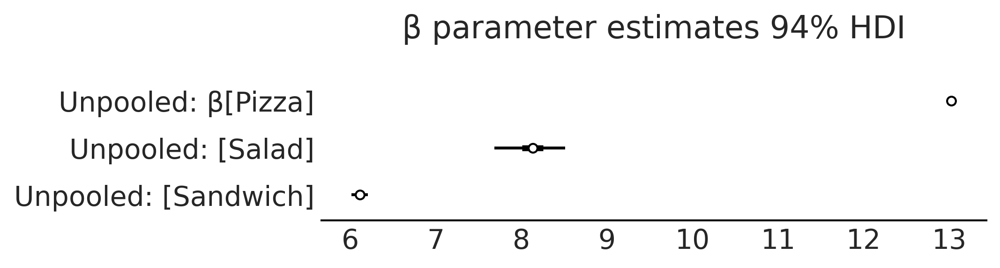

In [42]:
axes = az.plot_forest([idata_sales_unpooled],
                      model_names = ["Unpooled",],
                      var_names=["β"], combined=True, figsize=(7, 1.8));
axes[0].set_title("β parameter estimates 94% HDI")
plt.savefig("img/chp04/salad_sales_basic_regression_forestplot_beta.png")

### Figure 4.14

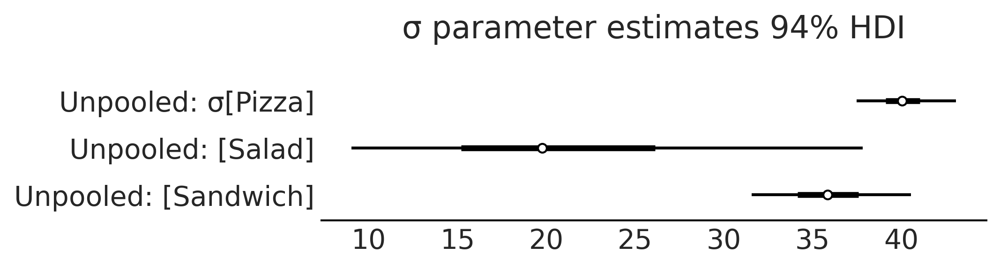

In [43]:
axes = az.plot_forest([idata_sales_unpooled],
                      model_names = ["Unpooled",],
                      var_names=["σ"], combined=True, figsize=(7, 1.8));
axes[0].set_title("σ parameter estimates 94% HDI")
plt.savefig("img/chp04/salad_sales_basic_regression_forestplot_sigma.png")

### Pooled Model

### Code 4.10

In [44]:
with pm.Model() as model_sales_pooled:
    σ = pm.HalfNormal("σ", 20)
    β = pm.Normal("β", mu=10, sigma=10)

    μ = pm.Deterministic("μ", β * customers)
    
    sales = pm.Normal("sales", mu=μ, sigma=σ,
                      observed=sales_observed)
                        
    idata_sales_pooled = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [σ, β]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


In [45]:
with model_sales_pooled:
    idata_sales_pooled.extend(pm.sample_posterior_predictive(idata_sales_pooled))

Sampling: [sales]


### Figure 4.16

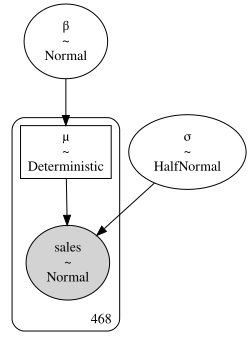

In [46]:
pooled_sales_diagram = pm.model_to_graphviz(model_sales_pooled)
pooled_sales_diagram.render("img/chp04/salad_sales_basic_regression_model_pooled", format="png", cleanup=True)
pooled_sales_diagram

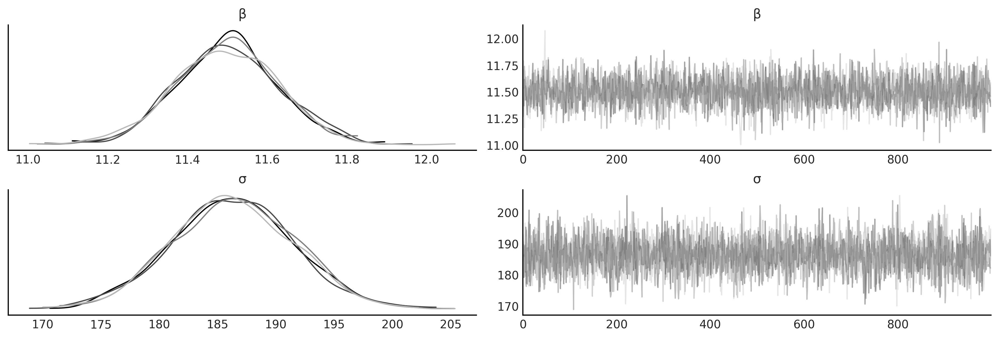

In [47]:
az.plot_trace(idata_sales_pooled, var_names=["β", "σ"], compact=False);

In [48]:
az.summary(idata_sales_pooled, var_names=["β", "σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β,11.499,0.128,11.260,11.744,0.002,0.001,3872.0,2692.0,1.0
σ,186.319,5.232,176.064,195.540,0.085,0.060,3791.0,2808.0,1.0


### Figure 4.17

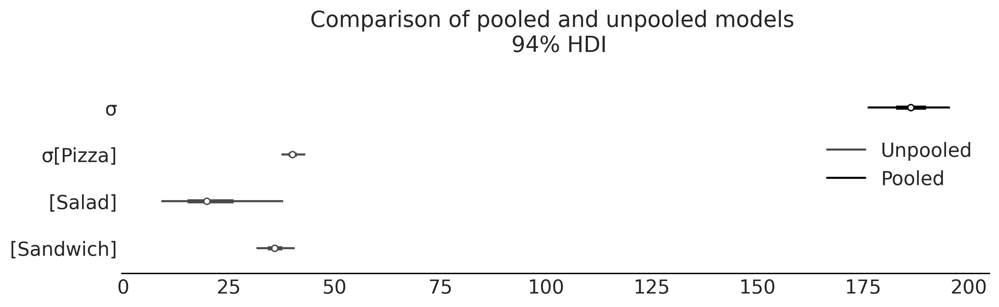

In [49]:
axes = az.plot_forest([idata_sales_pooled, idata_sales_unpooled],
                      model_names = ["Pooled", "Unpooled"], var_names=["σ"], combined=True, figsize=(10, 3));
axes[0].set_title("Comparison of pooled and unpooled models \n 94% HDI")

#plt.subplots_adjust(top=1)
plt.savefig("img/chp04/salad_sales_basic_regression_forestplot_sigma_comparison.png", bbox_inches='tight')

### Figure 4.18

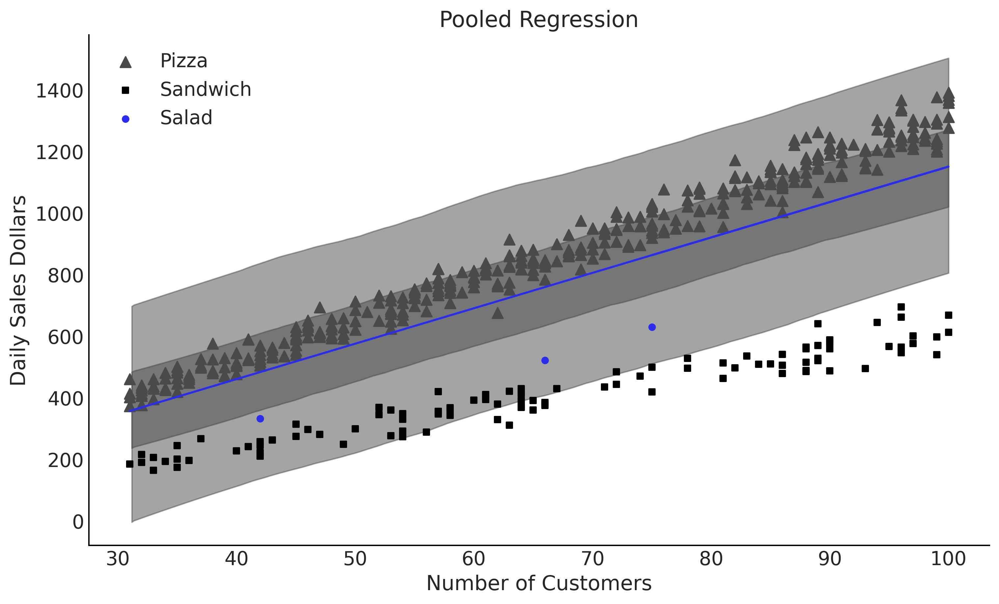

In [50]:
fig, ax = plt.subplots(figsize=(10, 6))
μ_m = idata_sales_pooled.posterior["μ"].mean(("chain", "draw"))
#σ_m = idata_sales_pooled.posterior["σ"].mean(("chain", "draw"))

ax.plot(customers, μ_m, c='C4')

az.plot_hdi(customers, idata_sales_pooled.posterior_predictive["sales"], hdi_prob=.50, ax=ax)
az.plot_hdi(customers, idata_sales_pooled.posterior_predictive["sales"], hdi_prob=.94, ax=ax)


pizza_df.plot(x="customers", y="sales", kind="scatter", ax=ax, c="C1", label="Pizza", marker="^", s=60);
sandwich_df.plot(x="customers", y="sales", kind="scatter", ax=ax,  label="Sandwich", marker="s");
salad_df.plot(x="customers", y="sales", kind="scatter", ax=ax, label="Salad", c="C4");


ax.set_xlabel("Number of Customers")
ax.set_ylabel("Daily Sales Dollars")
ax.set_title("Pooled Regression")
plt.savefig("img/chp04/salad_sales_basic_regression_scatter_pooled.png")

### Code 4.11

In [51]:
coords = {"meals":food_category.categories, "meals_idx":food_category}

with pm.Model(coords=coords) as model_pooled_sigma_sales:
    σ = pm.HalfNormal("σ", 20)
    β = pm.Normal("β", mu=10, sigma=20, dims="meals")
    
    μ = pm.Deterministic("μ", β[food_category.codes] * customers, dims="meals_idx")
    
    sales = pm.Normal("sales", mu=μ, sigma=σ, observed=sales_observed, dims="meals_idx")
    
    idata_pooled_sigma_sales = pm.sample()
    idata_pooled_sigma_sales.extend(pm.sample_posterior_predictive(idata_pooled_sigma_sales))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [σ, β]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.
Sampling: [sales]


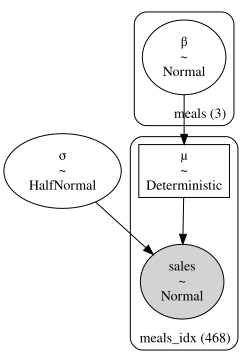

In [52]:
multilevel_sales_diagram = pm.model_to_graphviz(model_pooled_sigma_sales)
multilevel_sales_diagram.render("img/chp04/salad_sales_basic_regression_model_multilevel", format="png", cleanup=True)
multilevel_sales_diagram

In [53]:
az.summary(idata_pooled_sigma_sales, var_names=["β", "σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β[Pizza],13.025,0.030,12.967,13.081,0.000,0.000,5749.0,2976.0,1.0
β[Salad],8.130,0.352,7.490,8.812,0.004,0.003,6743.0,3479.0,1.0
β[Sandwich],6.112,0.057,6.009,6.227,0.001,0.000,6512.0,2861.0,1.0
σ,39.261,1.306,36.942,41.713,0.017,0.012,5496.0,2960.0,1.0


### Figure 4.20

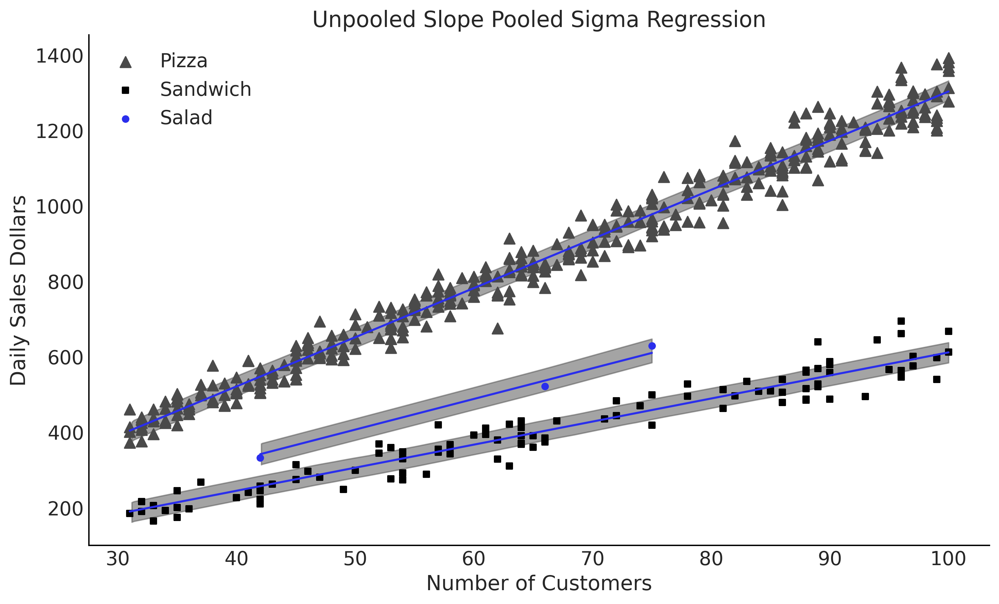

In [54]:
fig, ax = plt.subplots(figsize=(10, 6))
σ_m = idata_sales_pooled.posterior["σ"].mean().values

# Salads

for meal in food_category.categories:
    category_mask = (food_category==meal)
    μ_m_meals = idata_pooled_sigma_sales.posterior["μ"].sel({"meals_idx":meal})
    ax.plot(sales_df.customers[category_mask], μ_m_meals.mean(("chain", "draw")), c='C4')
    az.plot_hdi(sales_df.customers[category_mask], 
                idata_pooled_sigma_sales.posterior_predictive["sales"].sel({"meals_idx":meal}),
                hdi_prob=.50, ax=ax, fill_kwargs={"alpha": .5})


pizza_df.plot(x="customers", y="sales", kind="scatter", ax=ax, c="C1", label="Pizza", marker="^", s=60);
sandwich_df.plot(x="customers", y="sales", kind="scatter", ax=ax,  label="Sandwich", marker="s");
salad_df.plot(x="customers", y="sales", kind="scatter", ax=ax, label="Salad", c="C4");


ax.set_xlabel("Number of Customers")
ax.set_ylabel("Daily Sales Dollars")
ax.set_title("Unpooled Slope Pooled Sigma Regression")
plt.savefig("img/chp04/salad_sales_basic_regression_scatter_sigma_pooled_slope_unpooled.png")

### Figure 4.21

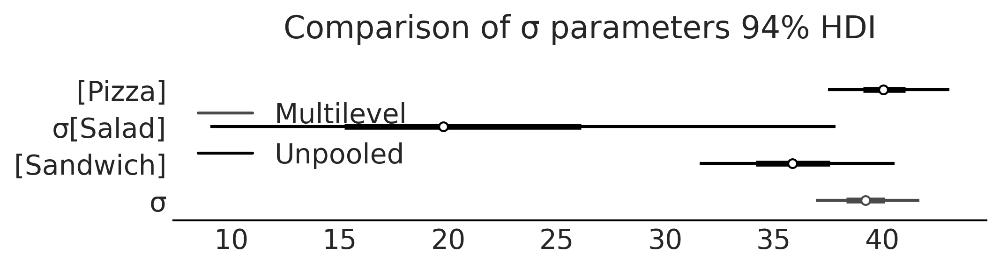

In [55]:
axes = az.plot_forest([idata_sales_unpooled,
                       idata_pooled_sigma_sales
                      ],
                      model_names = ["Unpooled",
                                     "Multilevel "
                                    ],
                      var_names=["σ"], combined=True, figsize=(7, 1.8));
axes[0].set_title("Comparison of σ parameters 94% HDI")

plt.savefig("img/chp04/salad_sales_forestplot_sigma_unpooled_multilevel_comparison.png")

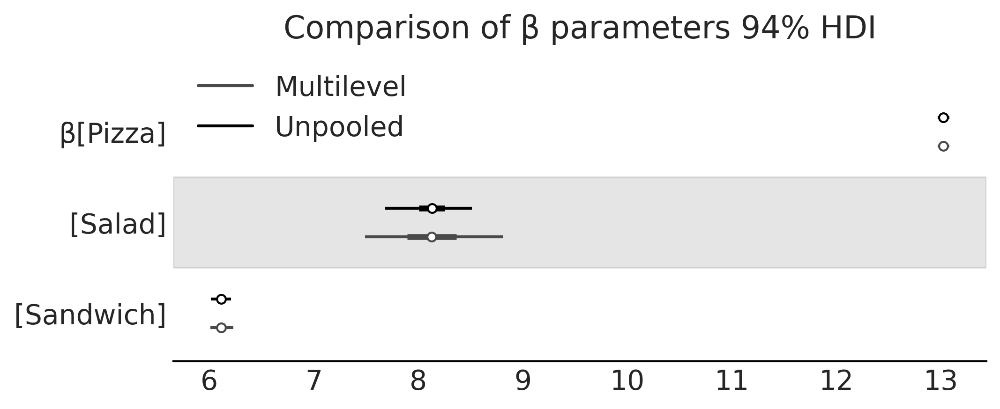

In [56]:
axes = az.plot_forest([idata_sales_unpooled,
                       idata_pooled_sigma_sales
                      ],
                      model_names = ["Unpooled",
                                     "Multilevel"
                                    ],
                      var_names=["β"], combined=True, figsize=(7, 2.8));
axes[0].set_title("Comparison of β parameters 94% HDI");

### Hierarchical

### Code 4.12

In [57]:
with pm.Model(coords=coords) as model_hierarchical_sales:
    σ_hyperprior = pm.HalfNormal("σ_hyperprior", 20)
    σ = pm.HalfNormal("σ", σ_hyperprior,  dims="meals")
    
    β = pm.Normal("β", mu=10, sigma=20, dims="meals")
    μ = pm.Deterministic("μ", β[food_category.codes] * customers)
    
    sales = pm.Normal("sales", mu=μ, sigma=σ[food_category.codes],
                      observed=sales_observed)
    
    idata_hierarchical_sales = pm.sample(target_accept=.9)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [σ_hyperprior, σ, β]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


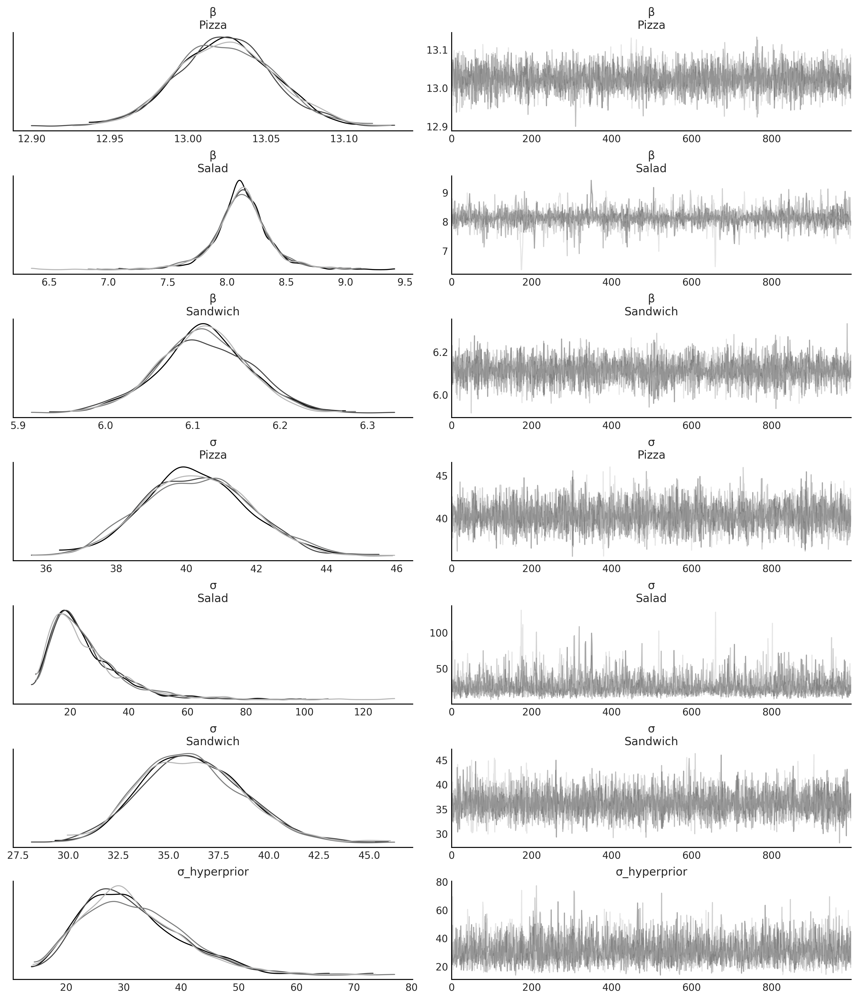

In [58]:
az.plot_trace(idata_hierarchical_sales, compact=False, var_names=["β", "σ", "σ_hyperprior"]);

<Axes: >

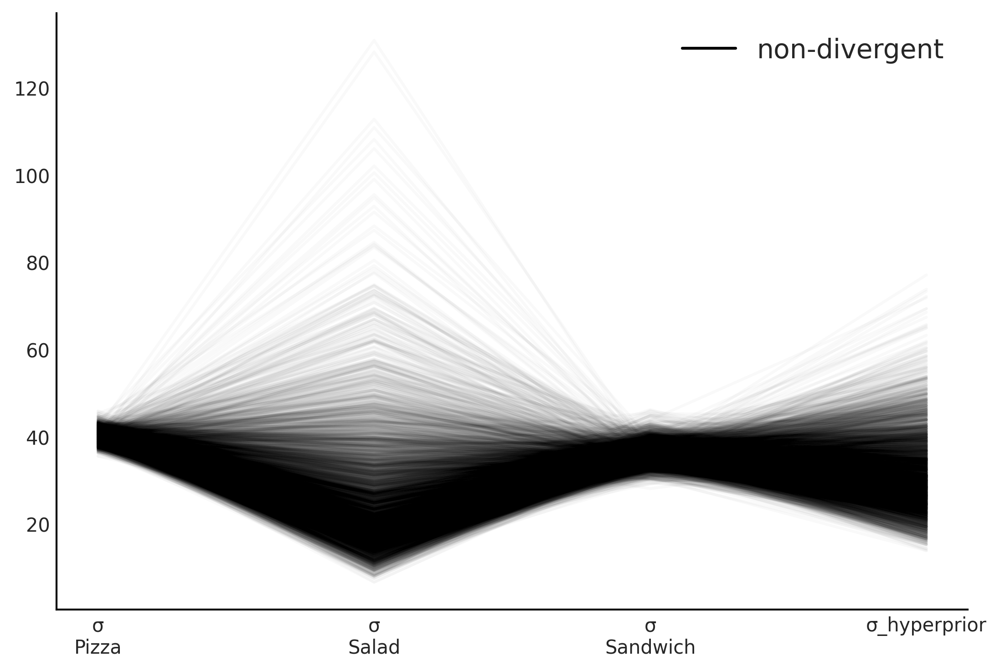

In [59]:
az.plot_parallel(idata_hierarchical_sales, var_names=["σ", "σ_hyperprior"])

### Figure 4.23

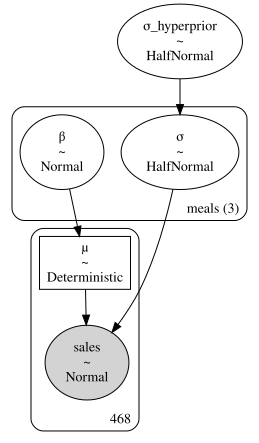

In [60]:
hierarchial_sales_diagram = pm.model_to_graphviz(model_hierarchical_sales)
hierarchial_sales_diagram.render("img/chp04/salad_sales_hierarchial_regression_model", format="png", cleanup=True)
hierarchial_sales_diagram

In [61]:
az.summary(idata_hierarchical_sales, var_names=["β", "σ"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β[Pizza],13.024,0.031,12.966,13.083,0.000,0.000,5746.0,3163.0,1.0
β[Salad],8.122,0.255,7.638,8.634,0.005,0.004,2851.0,2032.0,1.0
β[Sandwich],6.112,0.052,6.012,6.211,0.001,0.000,6046.0,2331.0,1.0
σ[Pizza],40.304,1.507,37.535,43.133,0.021,0.015,5242.0,3126.0,1.0
σ[Salad],25.292,12.763,8.097,46.978,0.261,0.203,2865.0,2911.0,1.0
σ[Sandwich],36.187,2.526,31.769,40.919,0.034,0.024,5800.0,2984.0,1.0


Text(0.5, 1.0, 'Hierarchical β estimates 94% HDI')

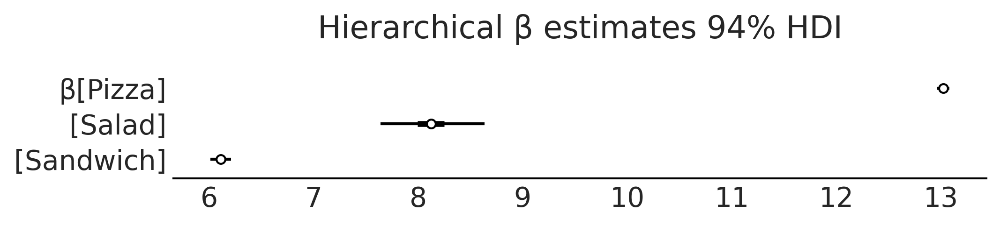

In [62]:
axes = az.plot_forest(idata_hierarchical_sales, var_names=["β"], combined=True,  figsize=(7, 1.5))
axes[0].set_title("Hierarchical β estimates 94% HDI")

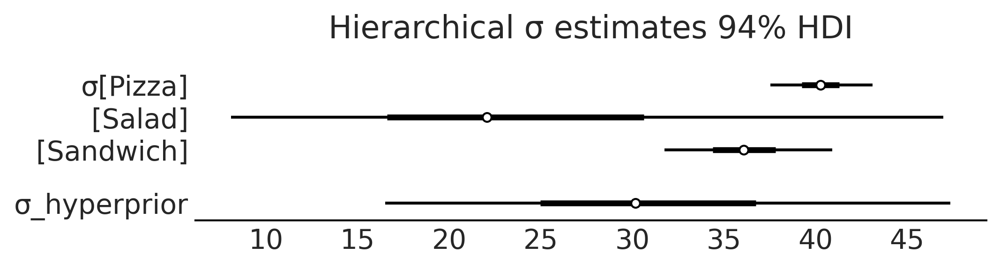

In [63]:
axes = az.plot_forest(idata_hierarchical_sales, var_names=["σ", "σ_hyperprior"], combined=True,  figsize=(7, 1.8))
axes[0].set_title("Hierarchical σ estimates 94% HDI")
plt.savefig("img/chp04/salad_sales_forestplot_sigma_hierarchical.png")


In [64]:
print(food_category.categories)

Index(['Pizza', 'Salad', 'Sandwich'], dtype='object')


### Table 4.3

In [65]:
az.summary(idata_sales_unpooled.posterior["σ"], kind="stats").round(1)

,mean,sd,hdi_3%,hdi_97%
σ[Pizza],40.1,1.5,37.5,43.1
σ[Salad],21.5,8.5,9.0,37.8
σ[Sandwich],36.0,2.5,31.6,40.6


### Table 4.4

In [66]:
az.summary(idata_hierarchical_sales, var_names=["σ", "σ_hyperprior"], kind="stats").round(1)

,mean,sd,hdi_3%,hdi_97%
σ[Pizza],40.3,1.5,37.5,43.1
σ[Salad],25.3,12.8,8.1,47.0
σ[Sandwich],36.2,2.5,31.8,40.9
σ_hyperprior,31.4,8.8,16.5,47.4


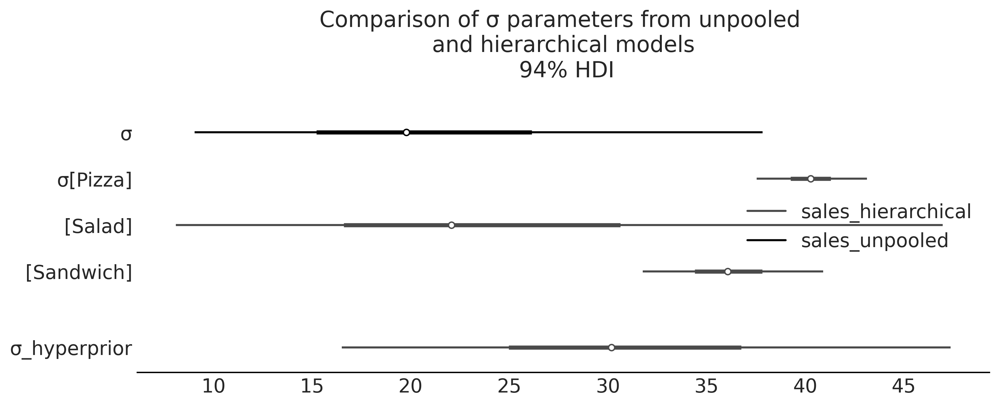

In [67]:
axes = az.plot_forest([idata_sales_unpooled.posterior["σ"].sel({"meals":"Salad"}),
                       idata_hierarchical_sales
                      ],
                      model_names = ["sales_unpooled",
                                     "sales_hierarchical"
                                    ], combined=True, figsize=(10, 4),
                     var_names=["σ", "σ_hyperprior"]
                     );
axes[0].set_title("Comparison of σ parameters from unpooled \n and hierarchical models \n 94% HDI")

plt.savefig("img/chp04/salad_sales_forestolot_sigma_unpooled_multilevel_comparison.png")

Text(0.5, 1.0, 'Comparison of Hierarchical versus Unpooled Variance')

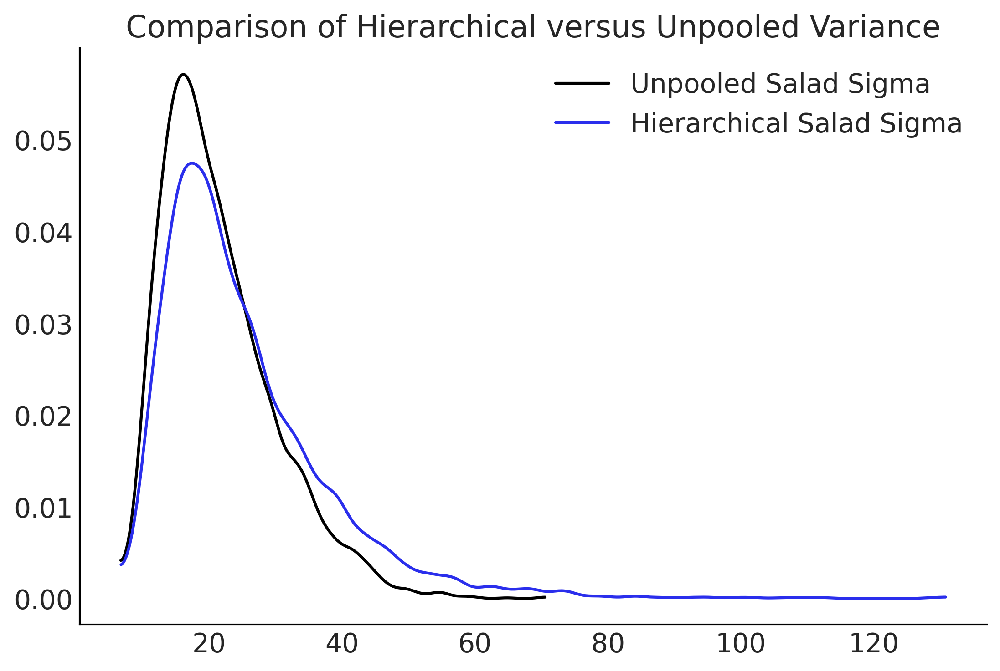

In [68]:
fig, ax = plt.subplots()
az.plot_kde(idata_sales_unpooled.posterior['σ'].sel({"meals":"Salad"}).values, 
            label="Unpooled Salad Sigma", ax=ax)
az.plot_kde(idata_hierarchical_sales.posterior["σ"].sel({"meals":"Salad"}).values, 
            label="Hierarchical Salad Sigma", plot_kwargs={"color":"C4"}, ax=ax)

ax.set_title("Comparison of Hierarchical versus Unpooled Variance")

### Figure 4.25

Text(0, 0.5, 'y')

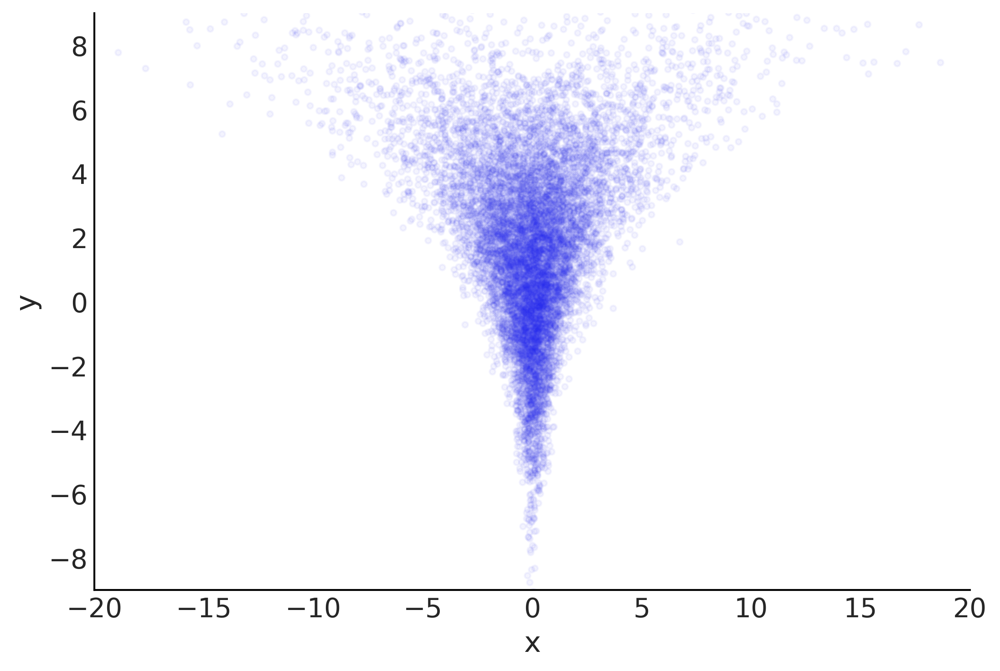

In [69]:
nsample = 10000
nd=1
yr = stats.norm.rvs(loc=2., scale=3., size=nsample)
xnr = stats.norm.rvs(loc=0., scale=np.exp(yr/4), size=(nd, nsample))

fig, ax = plt.subplots()
ax.scatter(xnr[0], yr, marker='.', alpha=.05, color="C4")
ax.set_xlim(-20, 20)
ax.set_ylim(-9, 9)
ax.set_xlabel('x')
ax.set_ylabel('y')

In [70]:
def salad_generator(hyperprior_beta_mean=5, hyperprior_beta_sigma=.2, sigma=50, days_per_location=[6, 4, 15, 10, 3, 5], sigma_per_location=[50,10,20,80,30,20]):
    """Generate noisy salad data"""
    beta_hyperprior = stats.norm(hyperprior_beta_mean, hyperprior_beta_sigma)
    
    # Generate demands days per restaurant
    df = pd.DataFrame()
    for i, days in enumerate(days_per_location):
        np.random.seed(0)

        num_customers = stats.randint(30, 100).rvs(days)
        sales_location = beta_hyperprior.rvs()*num_customers + stats.norm(0, sigma_per_location[i]).rvs(num_customers.shape)

        location_df = pd.DataFrame({"customers":num_customers, "sales":sales_location})
        location_df["location"] = i
        location_df.sort_values(by="customers", ascending=True)
        df = pd.concat([df, location_df])
        
    df.reset_index(inplace=True, drop=True)
    return df
hierarchical_salad_df = salad_generator()

### Figure 4.26

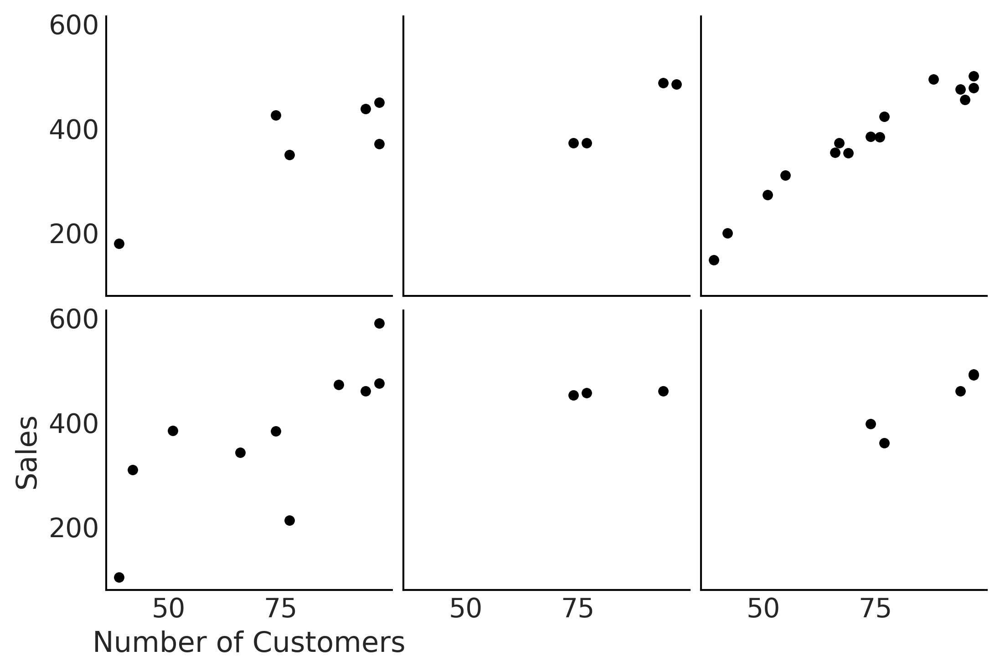

In [71]:
fig, axes, = plt.subplots(2,3, sharex=True, sharey=True)

for i, ax in enumerate(axes.ravel()):
    location_filter = (hierarchical_salad_df["location"] == i)
    hierarchical_salad_df[location_filter].plot(kind="scatter", x="customers", y="sales", ax=ax)
    ax.set_xlabel("")
    ax.set_ylabel("")

    
axes[1,0].set_xlabel("Number of Customers")
axes[1,0].set_ylabel("Sales");
plt.savefig("img/chp04/multiple_salad_sales_scatter.png")

### Code 4.13

In [72]:
# import tensorflow as tf
# import tensorflow_probability as tfp

# tfd = tfp.distributions
# root = tfd.JointDistributionCoroutine.Root

In [73]:
# run_mcmc = tf.function(
#     tfp.experimental.mcmc.windowed_adaptive_nuts,
#     autograph=False, jit_compile=True)

In [74]:
# def gen_hierarchical_salad_sales(input_df, beta_prior_fn, dtype=tf.float32):
#     customers = tf.constant(
#         hierarchical_salad_df["customers"].values, dtype=dtype)
#     location_category = hierarchical_salad_df["location"].values
#     sales = tf.constant(hierarchical_salad_df["sales"].values, dtype=dtype)

#     @tfd.JointDistributionCoroutine
#     def model_hierarchical_salad_sales():
#         β_μ_hyperprior = yield root(tfd.Normal(0, 10, name="beta_mu"))
#         β_σ_hyperprior = yield root(tfd.HalfNormal(.1, name="beta_sigma"))
#         β = yield from beta_prior_fn(β_μ_hyperprior, β_σ_hyperprior)

#         σ_hyperprior = yield root(tfd.HalfNormal(30, name="sigma_prior"))
#         σ = yield tfd.Sample(tfd.HalfNormal(σ_hyperprior), 6, name="sigma")

#         loc = tf.gather(β, location_category, axis=-1) * customers
#         scale = tf.gather(σ, location_category, axis=-1)
#         sales = yield tfd.Independent(tfd.Normal(loc, scale),
#                                       reinterpreted_batch_ndims=1,
#                                       name="sales")

#     return model_hierarchical_salad_sales, sales

### Code 4.14 and 4.15

In [ ]:
# def centered_beta_prior_fn(hyper_mu, hyper_sigma):
#     β = yield tfd.Sample(tfd.Normal(hyper_mu, hyper_sigma), 6, name="beta")
#     return β

# # hierarchical_salad_df is the generated dataset as pandas.DataFrame
# centered_model, observed = gen_hierarchical_salad_sales(
#     hierarchical_salad_df, centered_beta_prior_fn)

# mcmc_samples_centered, sampler_stats_centered = run_mcmc(
#     1000, centered_model, n_chains=4, num_adaptation_steps=1000,
#     sales=observed)

# divergent_per_chain = np.sum(sampler_stats_centered['diverging'], axis=0)
# print(f"""There were {divergent_per_chain} divergences after tuning per chain.""")

In [ ]:
# idata_centered_model = az.from_dict(
#     posterior={
#         k:np.swapaxes(v, 1, 0)
#         for k, v in mcmc_samples_centered._asdict().items()},
#     sample_stats={
#         k:np.swapaxes(sampler_stats_centered[k], 1, 0)
#         for k in ["target_log_prob", "diverging", "accept_ratio", "n_steps"]}
# )

# az.plot_trace(idata_centered_model, compact=True);

In [ ]:
# az.summary(idata_centered_model)

### Figure 4.27

In [ ]:
# slope = mcmc_samples_centered.beta[..., 4].numpy().flatten()
# sigma = mcmc_samples_centered.beta_sigma.numpy().flatten()
# divergences = sampler_stats_centered['diverging'].numpy().flatten()

# axes = az.plot_joint({"β[4]": slope, "β_σ_hyperprior": sigma},
#                      joint_kwargs={"alpha": .05}, figsize=(6, 6))
# axes[0].scatter(slope[divergences], sigma[divergences], c="C4", alpha=.3, label='divergent sample')
# axes[0].legend(frameon=True)
# axes[0].set_ylim(0, .3)
# axes[0].set_xlim(4.5, 5.5)

# plt.savefig("img/chp04/Neals_Funnel_Salad_Centered.png")

### Code 4.16

In [ ]:
# def non_centered_beta_prior_fn(hyper_mu, hyper_sigma):
#     β_offset = yield root(tfd.Sample(tfd.Normal(0, 1), 6, name="beta_offset"))
#     return β_offset * hyper_sigma[..., None] + hyper_mu[..., None]

# # hierarchical_salad_df is the generated dataset as pandas.DataFrame
# non_centered_model, observed = gen_hierarchical_salad_sales(
#     hierarchical_salad_df, non_centered_beta_prior_fn)

# mcmc_samples_noncentered, sampler_stats_noncentered = run_mcmc(
#     1000, non_centered_model, n_chains=4, num_adaptation_steps=1000,
#     sales=observed)

# divergent_per_chain = np.sum(sampler_stats_noncentered['diverging'], axis=0)
# print(f"""There were {divergent_per_chain} divergences after tuning per chain.""")

In [ ]:
# idata_non_centered_model = az.from_dict(
#     posterior={
#         k:np.swapaxes(v, 1, 0)
#         for k, v in mcmc_samples_noncentered._asdict().items()},
#     sample_stats={
#         k:np.swapaxes(sampler_stats_noncentered[k], 1, 0)
#         for k in ["target_log_prob", "diverging", "accept_ratio", "n_steps"]}
# )

# az.plot_trace(idata_non_centered_model, compact=True);

In [ ]:
# az.summary(idata_non_centered_model)

### Figure  4.28

In [ ]:
# noncentered_beta = (mcmc_samples_noncentered.beta_mu[..., None]
#         + mcmc_samples_noncentered.beta_offset * mcmc_samples_noncentered.beta_sigma[..., None])
# slope = noncentered_beta[..., 4].numpy().flatten()
# sigma = mcmc_samples_noncentered.beta_sigma.numpy().flatten()
# divergences = sampler_stats_noncentered['diverging'].numpy().flatten()

# axes = az.plot_joint({"β[4]": slope, "β_σ_hyperprior": sigma},
#                      joint_kwargs={"alpha": .05}, figsize=(6, 6))
# axes[0].scatter(slope[divergences], sigma[divergences], c="C4", alpha=.3, label='divergent sample')
# axes[0].legend(frameon=True)
# axes[0].set_ylim(0, .3)
# axes[0].set_xlim(4.5, 5.5)

# plt.savefig("img/chp04/Neals_Funnel_Salad_NonCentered.png")

### Figure 4.29

In [ ]:
# centered_β_sigma = mcmc_samples_centered.beta_sigma.numpy()
# noncentered_β_sigma = mcmc_samples_noncentered.beta_sigma.numpy()

In [ ]:
# fig, ax = plt.subplots()
# az.plot_kde(centered_β_sigma, label="Centered β_σ_hyperprior", ax=ax)
# az.plot_kde(noncentered_β_sigma, label="Noncentered β_σ_hyperprior", plot_kwargs={"color":"C4"}, ax=ax);

# ax.set_title("Comparison of Centered vs Non Centered Estimates");
# plt.savefig("img/chp04/Salad_Sales_Hierarchical_Comparison.png")

### Code 4.17

In [ ]:
# out_of_sample_customers = 50.

# @tfd.JointDistributionCoroutine
# def out_of_sample_prediction_model():
#     model = yield root(non_centered_model)
#     β = model.beta_offset * model.beta_sigma[..., None] + model.beta_mu[..., None]
    
#     β_group = yield tfd.Normal(
#         model.beta_mu, model.beta_sigma, name="group_beta_prediction")
#     group_level_prediction = yield tfd.Normal(
#         β_group * out_of_sample_customers,
#         model.sigma_prior,
#         name="group_level_prediction")
#     for l in [2, 4]:
#         yield tfd.Normal(
#             tf.gather(β, l, axis=-1) * out_of_sample_customers,
#             tf.gather(model.sigma, l, axis=-1),
#             name=f"location_{l}_prediction")

# amended_posterior = tf.nest.pack_sequence_as(
#     non_centered_model.sample(),
#     list(mcmc_samples_noncentered) + [observed],
# )
# ppc = out_of_sample_prediction_model.sample(var0=amended_posterior)

In [ ]:
# fig, ax = plt.subplots()

# az.plot_kde(ppc.group_level_prediction, plot_kwargs={"color":"C0"}, ax=ax, label="All locations")
# az.plot_kde(ppc.location_2_prediction, plot_kwargs={"color":"C2"}, ax=ax, label="Location 2")
# az.plot_kde(ppc.location_4_prediction, plot_kwargs={"color":"C4"}, ax=ax, label="Location 4")

# ax.set_xlabel("Predicted revenue with 50 customers")
# ax.set_xlim([0,600])

# ax.set_yticks([])

# plt.savefig("img/chp04/Salad_Sales_Hierarchical_Predictions.png")

### Code 4.18

In [ ]:
# out_of_sample_customers2 = np.arange(50, 90)

# @tfd.JointDistributionCoroutine
# def out_of_sample_prediction_model2():
#     model = yield root(non_centered_model)
    
#     β_new_loc = yield tfd.Normal(
#         model.beta_mu, model.beta_sigma, name="beta_new_loc")
#     σ_new_loc = yield tfd.HalfNormal(model.sigma_prior, name="sigma_new_loc")
#     group_level_prediction = yield tfd.Normal(
#         β_new_loc[..., None] * out_of_sample_customers2,
#         σ_new_loc[..., None],
#         name="new_location_prediction")

# ppc = out_of_sample_prediction_model2.sample(var0=amended_posterior)

In [ ]:
# az.plot_hdi(out_of_sample_customers2, ppc.new_location_prediction, hdi_prob=.95)